# Understanding your Deep Learning Models with Explainable AI

**Exercise - MLPM course 2024**

*Date: 21.11.2024*<br>

# Warm-up: Implementation of 3 basic methods

Try to implement from scratch the 3 following feature attribution methods:
1. **Gradient**. Parameters:
  - x (Tensor): input sample, (B * C * W * H)
  - model (torch.nn.Module): model
  - target (int): output dimension to explain
  - Output: gradient attributions (np.ndarray), (B * W * H) (averaged over channels)

2. **Input**$\times$**Gradient**. Parameters:
  - x (Tensor): input sample, (B * C * W * H)
  - model (torch.nn.Module): model
  - target (int): output dimension to explain
  - Output: gradient attributions (np.ndarray), (B * W * H) (averaged over channels)

3. **Occlusion**. Parameters:
  - x (Tensor): input sample, (B * C * W * H)
  - model (torch.nn.Module): model
  - target (int): output dimension to explain
  - baseline (float): reference value used for masking (default: zeros), (C * w * w)
  - w (int): for 2D inputs (e.g. images), size of the occlusion window
  - Output: gradient attributions (np.ndarray), (B * W * H) (averaged over channels)

## Example use case: Natural image classification on ImageNet

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Retrieve pretrained InceptionV3 network from torch hub
model = torch.hub.load('pytorch/vision:v0.10.0', 'inception_v3', pretrained=True)
model.eval()

Using cache found in /Users/joshuacohendumani/.cache/torch/hub/pytorch_vision_v0.10.0


Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [3]:
# Download ImageNet class names
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
with open("imagenet_classes.txt", "r") as f:
  categories = [s.strip() for s in f.readlines()]

--2024-11-27 01:54:13--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Résolution de raw.githubusercontent.com (raw.githubusercontent.com)… 2606:50c0:8000::154, 2606:50c0:8001::154, 2606:50c0:8002::154, ...
Connexion à raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8000::154|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 10472 (10K) [text/plain]
Sauvegarde en : « imagenet_classes.txt.3 »

imagenet_classes.tx 100%[===================>]  10,23K  --.-KB/s    ds 0s      

2024-11-27 01:54:14 (49,7 MB/s) — « imagenet_classes.txt.3 » sauvegardé [10472/10472]



In [4]:
print(categories)

['tench', 'goldfish', 'great white shark', 'tiger shark', 'hammerhead', 'electric ray', 'stingray', 'cock', 'hen', 'ostrich', 'brambling', 'goldfinch', 'house finch', 'junco', 'indigo bunting', 'robin', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel', 'kite', 'bald eagle', 'vulture', 'great grey owl', 'European fire salamander', 'common newt', 'eft', 'spotted salamander', 'axolotl', 'bullfrog', 'tree frog', 'tailed frog', 'loggerhead', 'leatherback turtle', 'mud turtle', 'terrapin', 'box turtle', 'banded gecko', 'common iguana', 'American chameleon', 'whiptail', 'agama', 'frilled lizard', 'alligator lizard', 'Gila monster', 'green lizard', 'African chameleon', 'Komodo dragon', 'African crocodile', 'American alligator', 'triceratops', 'thunder snake', 'ringneck snake', 'hognose snake', 'green snake', 'king snake', 'garter snake', 'water snake', 'vine snake', 'night snake', 'boa constrictor', 'rock python', 'Indian cobra', 'green mamba', 'sea snake', 'horned viper', 'diamondback', 

--2024-11-27 01:54:14--  https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/bc69043e2862758a1906c6a24a792bb28c6bb2ff/n02917067_bullet_train.JPEG
Résolution de raw.githubusercontent.com (raw.githubusercontent.com)… 2606:50c0:8001::154, 2606:50c0:8002::154, 2606:50c0:8003::154, ...
Connexion à raw.githubusercontent.com (raw.githubusercontent.com)|2606:50c0:8001::154|:443… connecté.
requête HTTP transmise, en attente de la réponse… 200 OK
Taille : 130887 (128K) [image/jpeg]
Sauvegarde en : « img.jpg »

img.jpg             100%[===================>] 127,82K  --.-KB/s    ds 0,06s   

2024-11-27 01:54:14 (2,18 MB/s) — « img.jpg » sauvegardé [130887/130887]



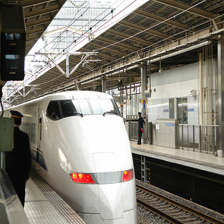

In [5]:
# Load example image from ImageNet
!wget https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/bc69043e2862758a1906c6a24a792bb28c6bb2ff/n02917067_bullet_train.JPEG -O img.jpg
from PIL import Image
from torchvision import transforms
input_image = Image.open('img.jpg')
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
input_image = input_image.resize((256,256)).crop((16, 16, 256-16, 256-16))
input_image


In [6]:
probs = model(input_batch).softmax(dim=1)
y_pred = probs.argmax(dim=1).item()
print(f"Predicted class: {categories[y_pred]} (p = {probs.max().item()})")

Predicted class: bullet train (p = 0.9999780654907227)


## Gradient

In [7]:
def gradient(
     x: torch.Tensor,
    model: torch.nn.Module,
    target: int ) -> np.ndarray:
    """
    x (Tensor): input sample, (B * C * W * H)
  - model (torch.nn.Module): model
  - target (int): output dimension to explain
  - Output: gradient attributions (np.ndarray), (B * W * H) (averaged over channels)"""

    x.requires_grad = True

    # Compute the gradient of the output with respect to the input
    y = model(x)
    target_score = y[:, target]

    model.zero_grad()

    # to treat batches independently : grad outputs
    gradient = torch.autograd.grad(target_score, x, grad_outputs=torch.ones_like(target_score))[0] #(B, C, H, W)
    attribution = gradient.mean(dim=1).cpu().numpy()

    return attribution

In [8]:
%%time
grad = gradient(input_batch, model, y_pred)

CPU times: user 124 ms, sys: 66.7 ms, total: 190 ms
Wall time: 111 ms


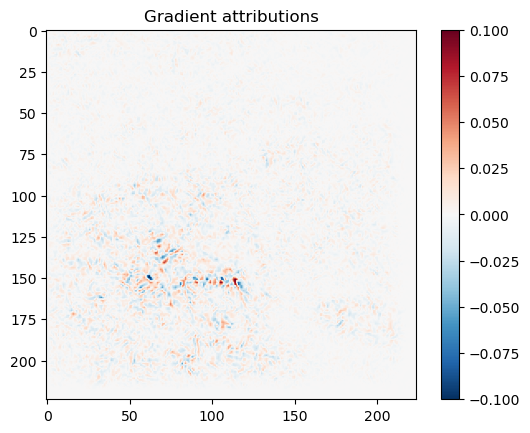

In [9]:
# Visualize attributions as a heatmap
plt.imshow(grad[0], cmap='RdBu_r', vmin=-0.1, vmax=0.1)
plt.title("Gradient attributions")
plt.colorbar()
plt.show()

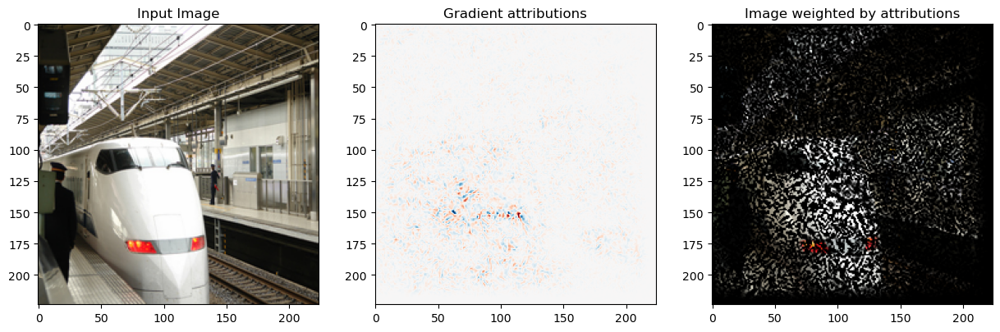

In [10]:
# Visualize them side-by-side with the input image
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax[0].imshow(input_image)
ax[0].set_title("Input Image")
ax[1].imshow(grad[0], cmap='RdBu_r', vmin=-0.1, vmax=0.1)
ax[1].set_title("Gradient attributions")
grad_scaled = np.clip(grad / np.quantile(grad, 0.95), 0, 1)
ax[2].imshow(input_image * grad_scaled[0,:,:,None] / 255)
ax[2].set_title("Image weighted by attributions")
plt.show()

## Input$\times$Gradient

In [11]:
def inputxgradient(x: torch.Tensor,
                   model: torch.nn.Module,
                   target: int,
                  ) -> np.ndarray:
                   
    """
    - x (Tensor): input sample, (B * C * W * H)
    - model (torch.nn.Module): model
    - target (int): output dimension to explain
    - Output: gradient attributions (np.ndarray), (B * W * H) (averaged over channels)
    """
    probs = model(x)

    y = model(x)
    target_score = y[:, target]

    model.zero_grad()
    # to treat batches indep : grad outputs
    attribution = torch.autograd.grad(target_score, x, grad_outputs=torch.ones_like(target_score))[0] #(B, C, H, W)
    attribution = attribution * x
    attribution = attribution.mean(dim=1).detach().cpu().numpy()
    print(attribution.shape)

    return attribution

In [12]:
%%time
inputxgrad = inputxgradient(input_batch, model, y_pred)

(1, 224, 224)
CPU times: user 175 ms, sys: 82.4 ms, total: 257 ms
Wall time: 136 ms


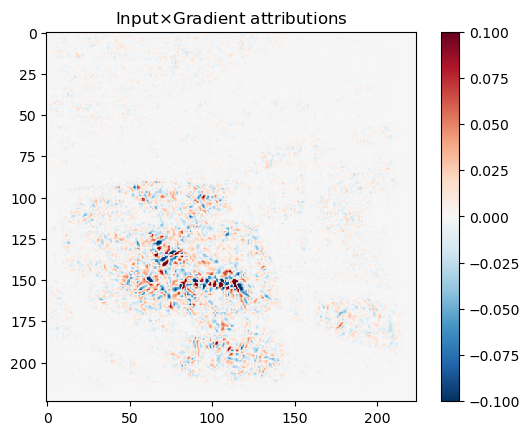

In [13]:
# Visualize attributions as a heatmap
plt.imshow(inputxgrad[0], cmap='RdBu_r', vmin=-0.1, vmax=0.1)
plt.title(r"Input$\times$Gradient attributions")
plt.colorbar()
plt.show()

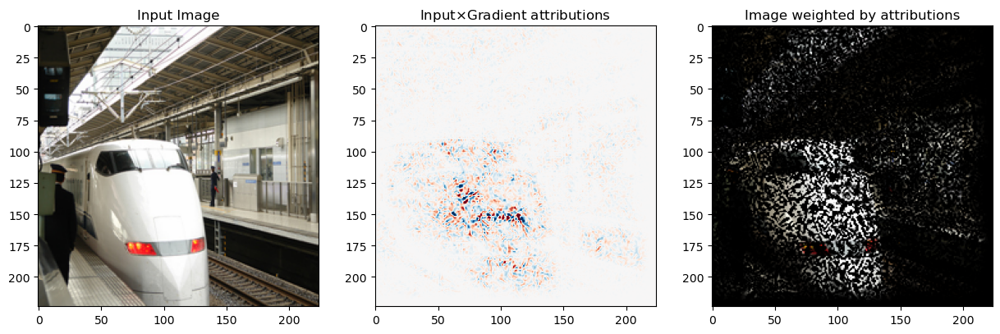

In [14]:
# Visualize them side-by-side with the input image
fig, ax = plt.subplots(1,3, figsize=(15,5))
ax[0].imshow(input_image)
ax[0].set_title("Input Image")
ax[1].imshow(inputxgrad[0], cmap='RdBu_r', vmin=-0.1, vmax=0.1)
ax[1].set_title(r"Input$\times$Gradient attributions")
inputxgrad_scaled = np.clip(inputxgrad / np.quantile(inputxgrad, 0.95), 0, 1)
ax[2].imshow(input_image * inputxgrad_scaled[0,:,:,None] / 255)
ax[2].set_title("Image weighted by attributions")
plt.show()

## Occlusion

In [15]:
def occlusion(
    x: torch.Tensor,
    model: torch.nn.Module,
    target: int,
    baseline: torch.Tensor,
    w: int = 1,
) -> np.ndarray:

  ### YOUR CODE HERE ###

  return ...

In [16]:
%%time
w = 4
baseline = ...
occ = occlusion(input_batch, model, y_pred, baseline=baseline, w=w)

CPU times: user 2 μs, sys: 0 ns, total: 2 μs
Wall time: 5.01 μs


In [17]:
# # Visualize attributions as a heatmap
# plt.imshow(occ[0], cmap='RdBu_r', vmin=-0.5, vmax=0.5)
# plt.title(f"Occlusion-{w} attributions")
# plt.colorbar()
# plt.show()

In [18]:
# # Visualize them side-by-side with the input image
# fig, ax = plt.subplots(1,3, figsize=(15,5))
# ax[0].imshow(input_image)
# ax[0].set_title("Input Image")
# ax[1].imshow(occ[0], cmap='RdBu_r', vmin=-0.5, vmax=0.5)
# ax[1].set_title(f"Occlusion-{w} attributions")
# occ_scaled = np.clip(occ / np.quantile(occ, 0.95), 0, 1)
# ax[2].imshow(input_image * occ_scaled[0,:,:,None] / 255)
# ax[2].set_title("Image weighted by attributions")
# plt.show()

# Exercise: Investigation of a crack detector

Let us consider the problem of crack detection in wall images. The task is expressed as binary classification.

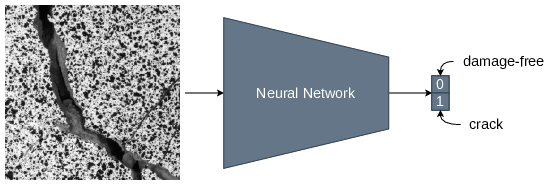

You are given the weights of three trained CNN models (`model_A`, `model_B` and `model_C`), and a test data set with positive images (with cracks) and negative images (without cracks).

**Step 1**. Evaluate the performance of the three models on the test set using relevant performance metrics.

**Step 2**. Can you trust the outcomes of these models? Investigate the predictions of each model using at least two different explainable AI (XAI) techniques and report your findings.

**Step 3**. Which of the three models would you choose to use in production?

**Step 4**. For the two other models, how could you explain what happened? Propose ideas to avoid this kind of problems and build more trustworthy models in the future.

Code for data and model loading is given below.

Some useful XAI libraries:

* [captum](https://github.com/pytorch/captum)
* [pytorch-grad-cam](https://github.com/jacobgil/pytorch-grad-cam)
* [lime](https://github.com/marcotcr/lime)
* [shap](https://github.com/shap/shap)
* [xplique](https://github.com/deel-ai/xplique)
* [iNNvestigate](https://github.com/albermax/innvestigate)
* ...and many more!

Modules can be installed in colab using e.g. `!pip install captum`.

## 1. Set up dataset and models

In [19]:
!git clone https://github.com/EPFL-IMOS/IMC-HOW-XAI.git

fatal: destination path 'IMC-HOW-XAI' already exists and is not an empty directory.


In [20]:
base_path = "./IMC-HOW-XAI"  # CHANGE THIS PATH IF NEEDED

### Data and model loading code

In [ ]:
import os
import matplotlib.pyplot as plt
import cv2
import random
import numpy as np
import torch
from torch import nn
from torch.utils.data import ConcatDataset, Dataset
import torchvision
from torchvision import transforms as T
from torchvision.transforms import functional as F
from sklearn.metrics import roc_curve, auc, precision_score, recall_score, f1_score, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt

# Data transformations
class Compose:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, target=None):
        for t in self.transforms:
            image, target = t(image, target)
        return image, target

class ToTensor:
    def __call__(self, image, target=None):
        image = F.to_tensor(image)
        if target is not None:
            target = torch.as_tensor(target, dtype=torch.int64)
        return image, target

class RandomResize:
    def __init__(self, min_size, max_size=None):
        self.min_size = min_size
        if max_size is None:
            max_size = min_size
        self.max_size = max_size

    def __call__(self, image, target=None):
        size = random.randint(self.min_size, self.max_size)
        image = F.resize(image, size)
        if target is not None:
            target = F.resize(target.unsqueeze(0), size, interpolation=F.InterpolationMode.NEAREST).squeeze(0)
        return image, target


class RandomHorizontalFlip:
    def __init__(self, flip_prob):
        self.flip_prob = flip_prob

    def __call__(self, image, target=None):
        if random.random() < self.flip_prob:
            image = F.hflip(image)
            if target is not None:
                target = F.hflip(target)
        return image, target


class RandomVerticalFlip:
    def __init__(self, flip_prob):
        self.flip_prob = flip_prob

    def __call__(self, image, target=None):
        if random.random() < self.flip_prob:
            image = F.vflip(image)
            if target is not None:
                target = F.vflip(target)
        return image, target

def get_train_transform(crop_size=64, size=256):
    transforms = [
        ToTensor(),
        RandomResize(size),
        RandomHorizontalFlip(flip_prob=0.5),
        RandomVerticalFlip(flip_prob=0.5)
    ]
    return Compose(transforms)

def get_val_transform(crop_size=64, size=256):
    transforms = [
        ToTensor(),
        RandomResize(size)
    ]
    return Compose(transforms)

In [22]:
# Dataset class
TRAIN_IMAGES_POSITIVE = [
    "train_positive"
]

TRAIN_IMAGES_NEGATIVE = [
    "train_negative"
]

TRAIN_IMAGES = TRAIN_IMAGES_POSITIVE + TRAIN_IMAGES_NEGATIVE

VAL_IMAGES_POSITIVE = [
    "val_positive"
]

VAL_IMAGES_NEGATIVE = [
    "val_negative"
]

VAL_IMAGES = VAL_IMAGES_POSITIVE + VAL_IMAGES_NEGATIVE

TEST_IMAGES_POSITIVE = [
    "test_positive"
]

TEST_IMAGES_NEGATIVE = [
    "test_negative"
]

TEST_IMAGES = TEST_IMAGES_POSITIVE + TEST_IMAGES_NEGATIVE

SEED = 42


class DICCracksDatasetFold(Dataset):
    def __init__(self, root, fold="train", segmentation=True, transform=None):
        """
        fold: train, val or test
        """
        self.root = root
        self.fold = fold
        self.segmentation = segmentation
        self.images = sorted(os.listdir(os.path.join(root, fold)))

        if os.path.exists(os.path.join(root, fold + "_GT")):
            self.masks = sorted(os.listdir(os.path.join(root, fold + "_GT")))
        else:
            self.masks = [None] * len(self.images)

        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        image = cv2.imread(os.path.join(self.root, self.fold, image))
        if mask is not None:
            mask = cv2.imread(os.path.join(self.root, self.fold + "_GT", mask), cv2.IMREAD_GRAYSCALE) / 255
        else:
            mask = np.zeros((image.shape[0], image.shape[1]), dtype="uint8")

        if self.transform is not None:
            image, mask = self.transform(image, mask)

        if not self.segmentation:
            mask = mask.max().item()  # binary classification label

        return image, mask, self.images[idx]


class DICCracksDataset(ConcatDataset):
    def __init__(self, root, fold="train", segmentation=True, positive_only=False, negative_only=False, **kwargs):
        assert fold in ["train", "val", "test"], f"fold {fold} not in train, val or test"

        if fold == "val":
            if positive_only:
                self.folds = VAL_IMAGES_POSITIVE
            elif negative_only:
                self.folds = VAL_IMAGES_NEGATIVE
            else:
                self.folds = VAL_IMAGES
        elif fold == "test":
            if positive_only:
                self.folds = TEST_IMAGES_POSITIVE
            elif negative_only:
                self.folds = TEST_IMAGES_NEGATIVE
            else:
                self.folds = TEST_IMAGES
        elif fold == "train":
            if positive_only:
                self.folds = TRAIN_IMAGES_POSITIVE
            elif negative_only:
                self.folds = TEST_IMAGES_NEGATIVE
            else:
                self.folds = TRAIN_IMAGES
        else:
            raise NotImplementedError()

        # initialize a concat dataset with the corresponding folds
        super().__init__(
            [
                DICCracksDatasetFold(root, fold, segmentation, **kwargs)
                for fold in self.folds
            ]
        )

In [23]:
ds_test = DICCracksDataset(
    root=os.path.join(base_path, "crack_dataset"),
    fold="test",
    transform=get_val_transform(),
    segmentation=False
)

batch_size = 8
test_loader = torch.utils.data.DataLoader(
    ds_test, batch_size=batch_size, drop_last=False
)

### Display a test image

Label =  1


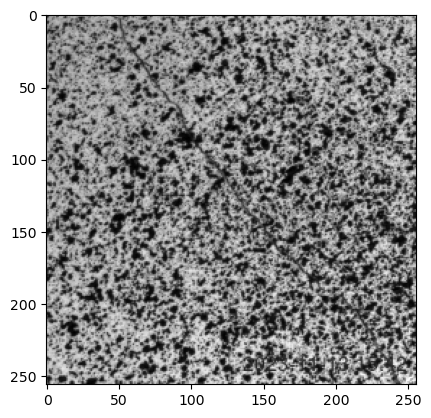

In [59]:
img, label, _ = ds_test[0]
print("Label = ", label)
plt.imshow(img[0].numpy(), cmap="gray");

### Load the 3 pretrained models

In [25]:
models = {
    "A": os.path.join(base_path, "weights",  "model_A.pth"),
    "B": os.path.join(base_path, "weights", "model_B.pth"),
    "C": os.path.join(base_path, "weights", "model_C.pth")
}

In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [27]:
def build_model(weights):
    # Create VGG11 model
    model = torchvision.models.vgg11()
    # modify average pooling for 256*256 inputs (instead of 224*224)
    model.avgpool = nn.AdaptiveAvgPool2d((8, 8))
    # modify the classification head to use 128 neurons instead of 4096
    (
        model.classifier[0],
        model.classifier[3],
        model.classifier[6],
    ) = (nn.Linear(512 * 8 * 8, 128), nn.Linear(128, 128), nn.Linear(128, 2))

    # Load weights
    model.load_state_dict(torch.load(weights, weights_only=True))
    return model

In [28]:
model_A, model_B, model_C = (build_model(models[id]) for id in ("A", "B", "C"))

## 2. Investigation of the models

### Step 1

**Evaluate the performance of the three models on the test set using relevant performance metrics.**

In [92]:
### YOUR CODE HERE ###

def evaluate_and_analyze_model(model, dataloader, model_name =''):
    
    model.eval() # Set model to evaluation mode
    all_probs, all_labels, all_preds = [], [], []

    with torch.no_grad():
        for images, labels, _ in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Predicted probabilities for ROC and metrics
            probs = torch.softmax(outputs, dim=1)[:, 1]
            all_probs.extend(probs.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            # Predicted classes for confusion matrix and metrics
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())

    # Convert collected results to numpy arrays
    all_labels = np.array(all_labels)
    all_preds = np.array(all_preds)
    all_probs = np.array(all_probs)

    #Evaluation Metrics
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, zero_division=0)
    recall = recall_score(all_labels, all_preds, zero_division=0)
    f1 = f1_score(all_labels, all_preds, zero_division=0)

    # AUC-ROC Curve
    fpr, tpr, _ = roc_curve(all_labels, all_probs)
    roc_auc = auc(fpr, tpr)

    #Confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    #plots
    plt.figure()
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f})', lw = 2)
    plt.plot([0, 1], [0, 1])
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve for {model_name}')
    plt.legend(loc="lower right")
    plt.show()

    # metrics
    print(f"Model Metrics:")
    print(f"Accuracy: {accuracy:.4f}")
    print(f"AUC-ROC: {roc_auc:.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")
    print("\nConfusion Matrix:")
    print(cm)

    return all_labels, all_preds

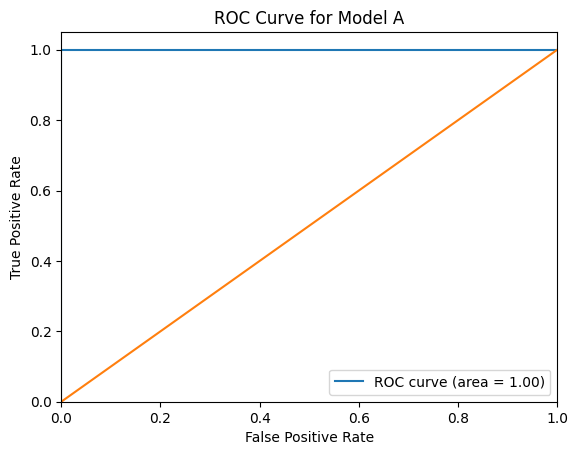

Model Metrics:
Accuracy: 1.0000
AUC-ROC: 1.0000
Precision: 1.0000
Recall: 1.0000
F1 Score: 1.0000

Confusion Matrix:
[[209   0]
 [  0 100]]


In [91]:
labels_a, preds_a = evaluate_and_analyze_model(model_A, test_loader, 'Model A')

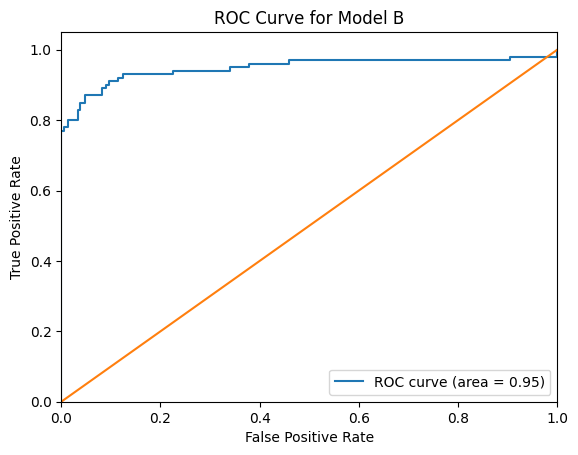

Model Metrics:
Accuracy: 0.9223
AUC-ROC: 0.9480
Precision: 0.9634
Recall: 0.7900
F1 Score: 0.8681

Confusion Matrix:
[[206   3]
 [ 21  79]]


In [90]:
labels_b, preds_b = evaluate_and_analyze_model(model_B, test_loader, 'Model B')

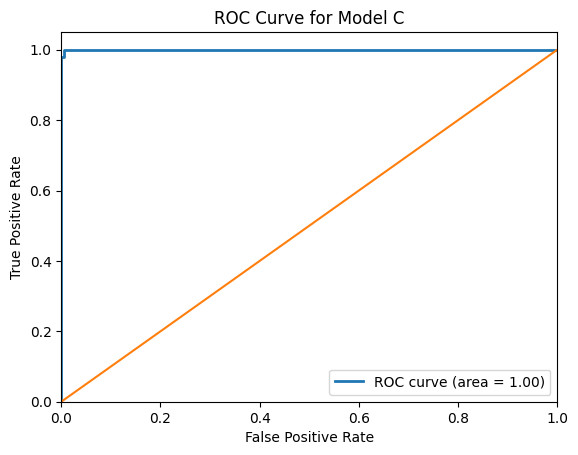

Model Metrics:
Accuracy: 0.9871
AUC-ROC: 0.9999
Precision: 1.0000
Recall: 0.9600
F1 Score: 0.9796

Confusion Matrix:
[[209   0]
 [  4  96]]


In [93]:
labels_c, preds_c = evaluate_and_analyze_model(model_C, test_loader, 'Model C')

### Step 2

**Can you trust the outcomes of these models? Investigate the predictions of each model using at least 2 different explainable AI (XAI) techniques and report your findings.**

We'll be using LIME and Grad-Cam 

In [44]:
import lime
import lime.lime_image
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

/Users/joshuacohendumani/anaconda3/envs/ml4pm/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [45]:

def preprocess_image(img):
    """Preprocess image for XAI techniques"""
    # Ensure image is in correct format for visualization and explanation
    img_np = img.permute(1, 2, 0).numpy()
    img_np = (img_np - img_np.min()) / (img_np.max() - img_np.min())
    return img_np

In [46]:
def lime_explanation(model, image, class_names=['No Crack', 'Crack']):
    """
    Generate LIME explanation for an image
    
    Args:
    - model: PyTorch model
    - image: torch tensor of the image
    - class_names: list of class names
    
    Returns:
    - LIME explanation visualization
    """
    # Prepare model for LIME
    def torch_predict(images):
        model.eval()
        with torch.no_grad():
            # Convert numpy images back to torch tensor
            images_tensor = torch.from_numpy(images).permute(0, 3, 1, 2).float()
            outputs = model(images_tensor)
            return outputs.numpy()
    
    # Preprocess image
    img_np = preprocess_image(image)
    
    # Create LIME explainer
    explainer = lime.lime_image.LimeImageExplainer()
    
    # Generate explanation
    explanation = explainer.explain_instance(
        img_np, 
        torch_predict, 
        top_labels=2, 
        hide_color=0, 
        num_samples=1000
    )
    
    # Get the explanation for the predicted class
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], 
        positive_only=True, 
        num_features=5, 
        hide_rest=True
    )
    
    # Visualize
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.title('Original Image')
    plt.imshow(img_np)
    plt.subplot(122)
    plt.title(f'LIME Explanation ({class_names[explanation.top_labels[0]]})')
    plt.imshow(temp)
    plt.tight_layout()
    plt.show()
    
    return explanation

In [ ]:
def grad_cam_explanation(model, image, class_names=['No Crack', 'Crack']):
    """
    Generate Grad-CAM explanation for an image
    
    Args:
    - model: PyTorch model
    - image: torch tensor of the image
    - class_names: list of class names
    
    Returns:
    - Grad-CAM heatmap visualization
    """
    # Determine the target layer (for VGG11, use features[-1])
    target_layers = [model.features[-1]]
    
    # Prepare image
    img_np = preprocess_image(image)
    
    # Create Grad-CAM
    cam = GradCAM(model=model, target_layers=target_layers)
    
    # Get model's prediction
    output = model(image.unsqueeze(0))
    pred_class = torch.argmax(output, dim=1).item()
    
    # Create target
    targets = [ClassifierOutputTarget(pred_class)]
    
    # Generate CAM
    grayscale_cam = cam(input_tensor=image.unsqueeze(0), targets=targets)
    grayscale_cam = grayscale_cam[0, :]
    
    # Visualize
    visualization = show_cam_on_image(img_np, grayscale_cam, use_rgb=True)
    
    plt.figure(figsize=(10, 5))
    plt.subplot(121)
    plt.title('Original Image')
    plt.imshow(img_np)
    plt.subplot(122)
    plt.title(f'Grad-CAM ({class_names[pred_class]})')
    plt.imshow(visualization)
    plt.tight_layout()
    plt.show()
    
    return grayscale_cam

In [ ]:
def xai_analysis(model, test_loader):
    """
    Perform XAI analysis on a selection of images from the test set
    
    Args:
    - model: PyTorch model to analyze
    - test_loader: DataLoader with test images
    """
    print(f"\n--- XAI Analysis for Model ---")
    
    # Select a few images to explain (mix of crack and no-crack)
    samples = []
    labels = []
    
    for images, image_labels, _ in test_loader:
        samples.extend(images)
        labels.extend(image_labels)
        
        if len(samples) >= 3:
            break
    
    for i, (image, label) in enumerate(zip(samples, labels)):
        print(f"\nImage {i+1} - True Label: {'Crack' if label == 1 else 'No Crack'}")
        
        # LIME Explanation
        print("\nLIME Explanation:")
        lime_explanation(model, image)
        
        # Grad-CAM Explanation
        print("\nGrad-CAM Explanation:")
        grad_cam_explanation(model, image)
        
        # Limit to first 3 images
        if i == 2:
            break

XAI Analysis for Model A:

--- XAI Analysis for Model ---

Image 1 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:40<00:00, 24.90it/s]


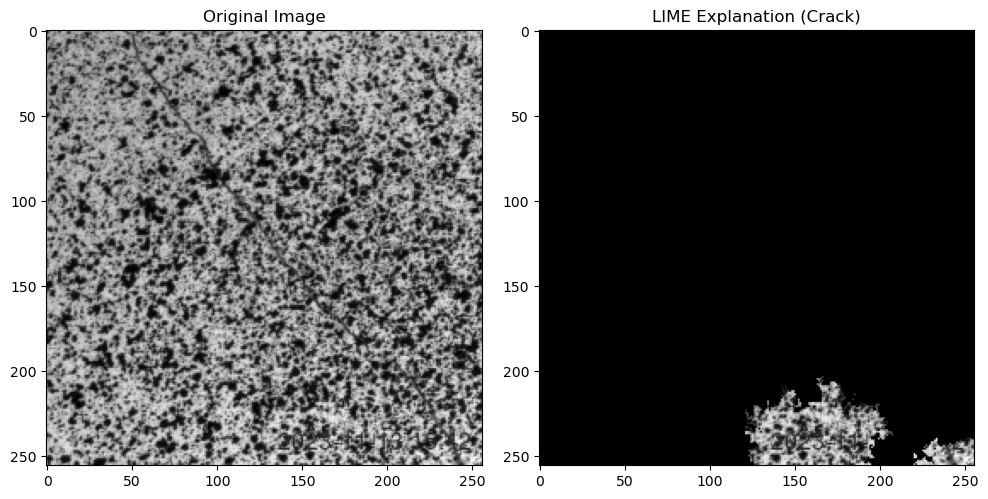


Grad-CAM Explanation:


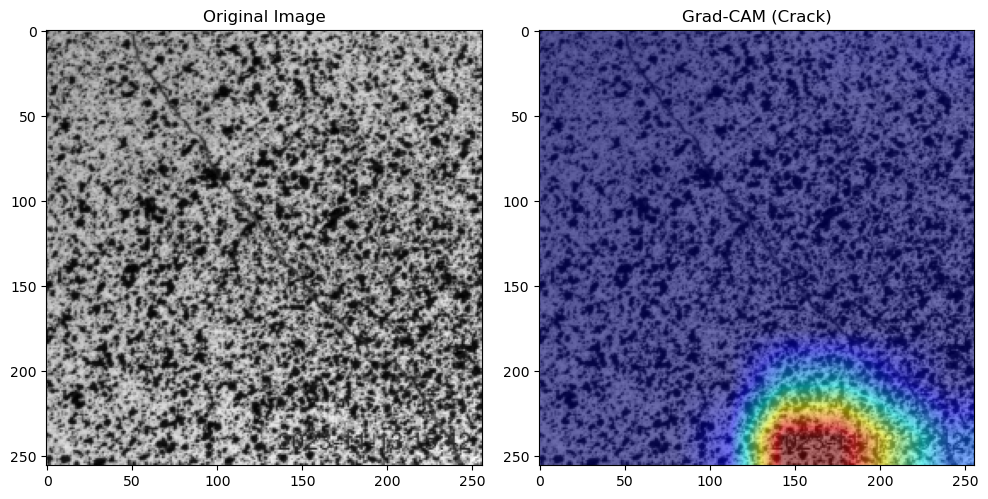


Image 2 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:42<00:00, 23.81it/s]


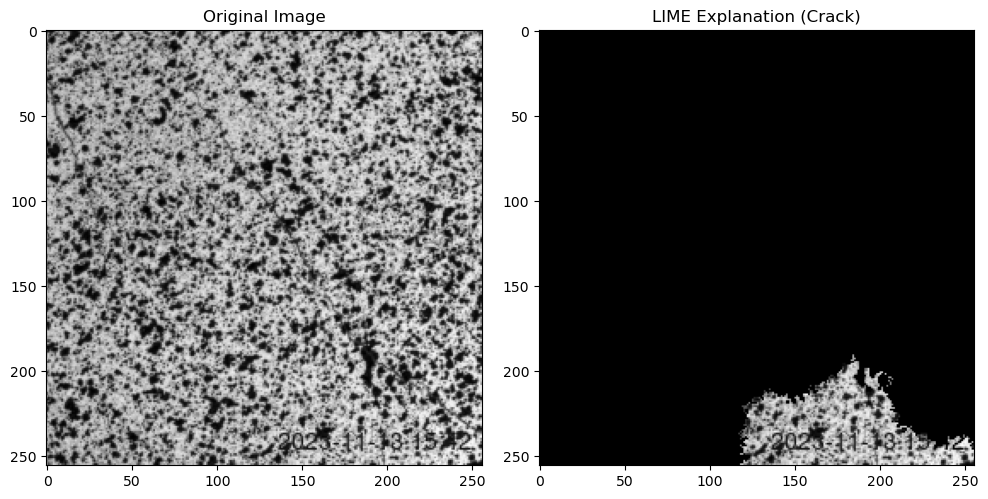


Grad-CAM Explanation:


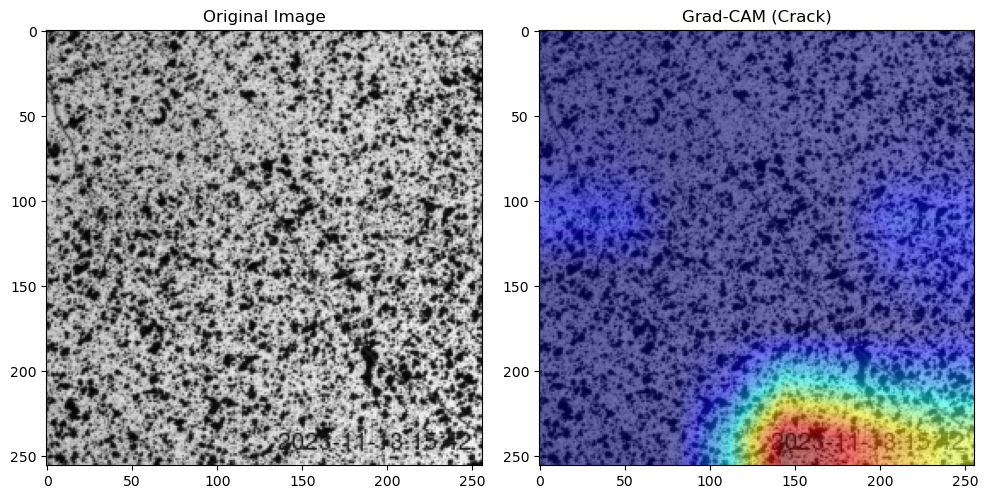


Image 3 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:40<00:00, 24.89it/s]


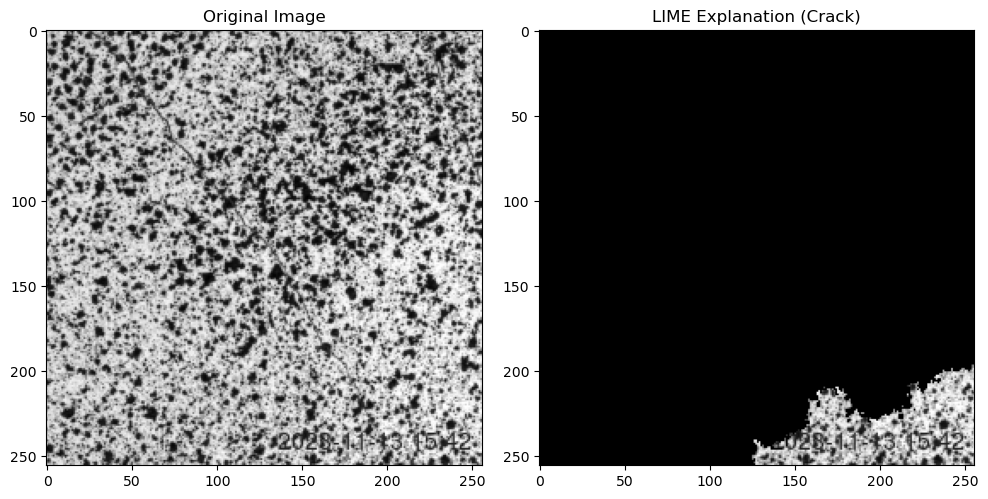


Grad-CAM Explanation:


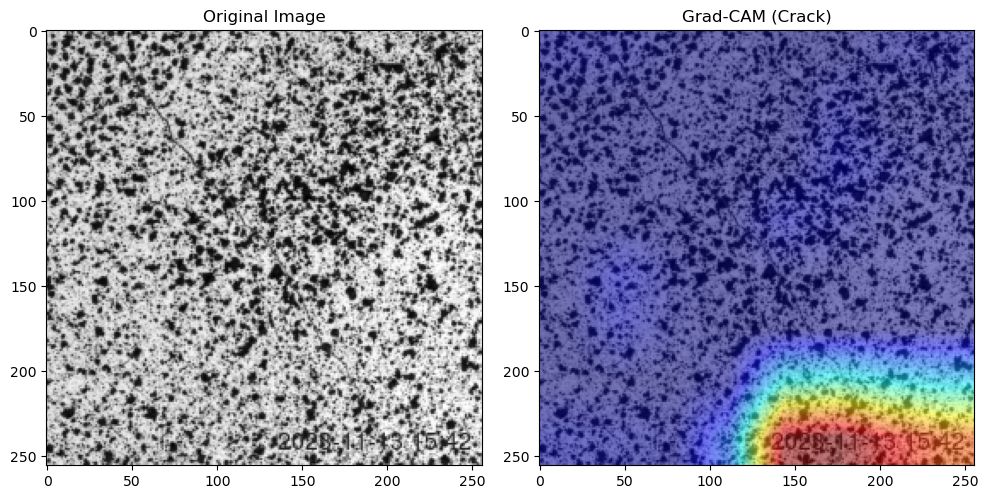

In [52]:
print("XAI Analysis for Model A:")
xai_analysis(model_A, test_loader)

XAI Analysis for Model B:

--- XAI Analysis for Model ---

Image 1 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:42<00:00, 23.68it/s]


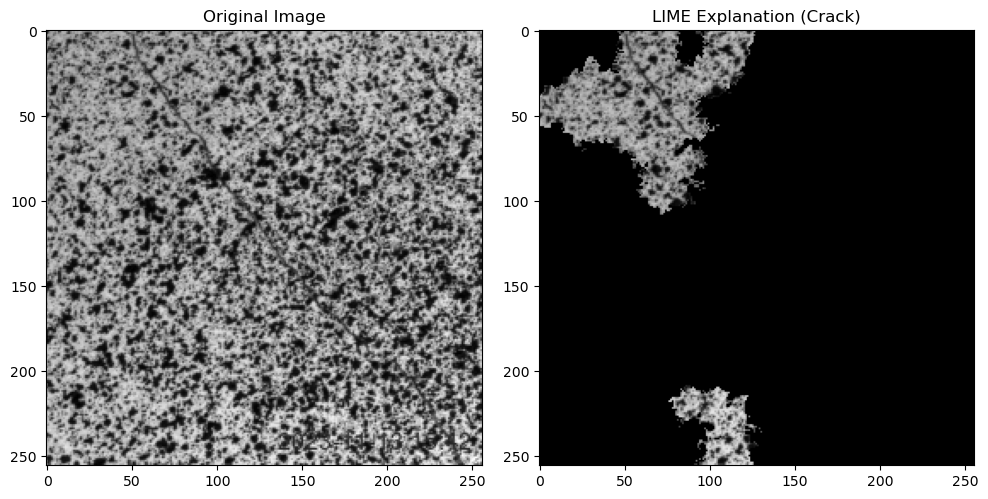


Grad-CAM Explanation:


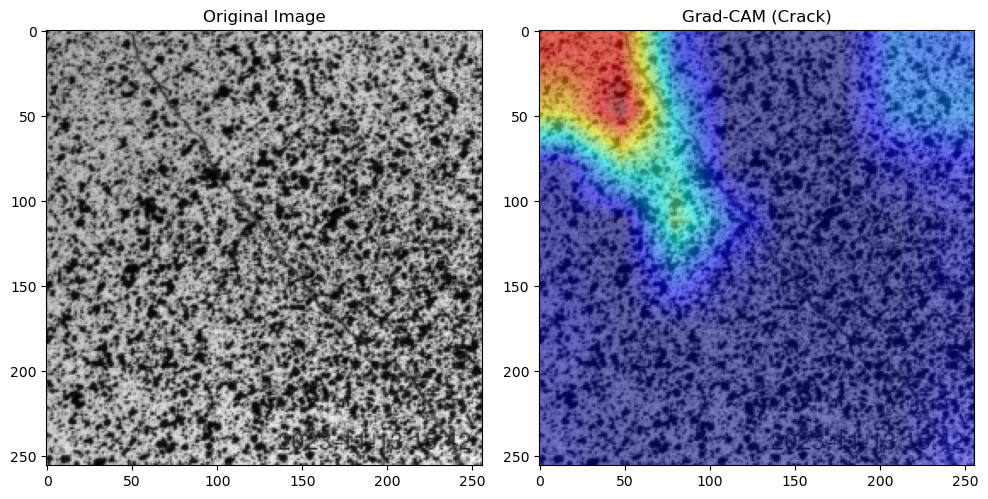


Image 2 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:41<00:00, 23.93it/s]


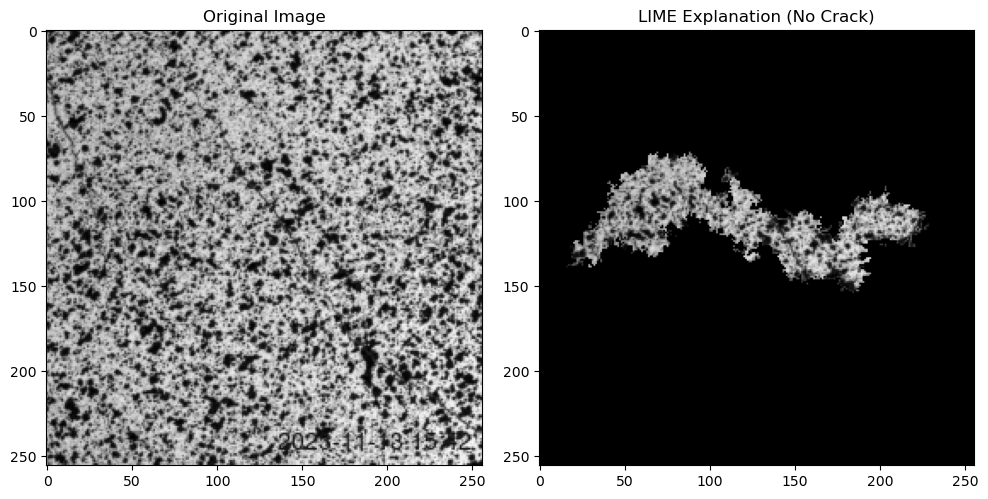


Grad-CAM Explanation:


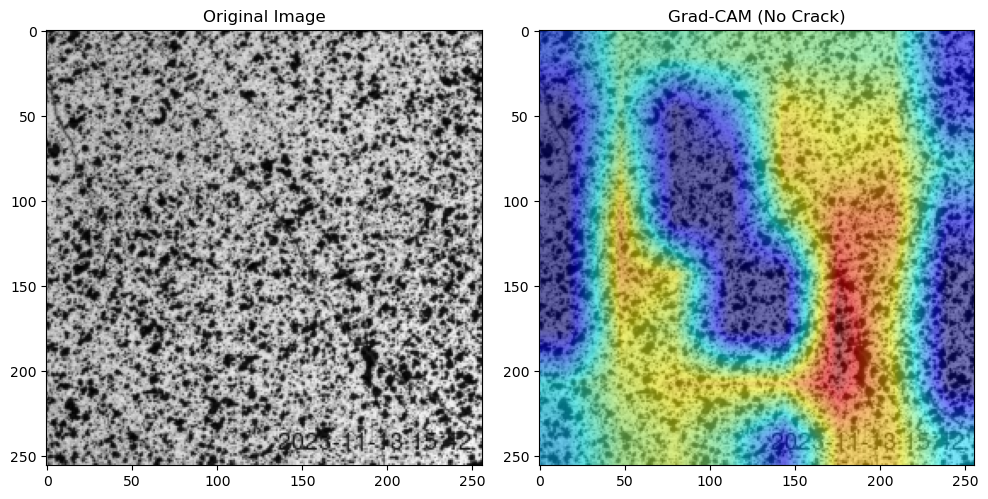


Image 3 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:41<00:00, 23.81it/s]


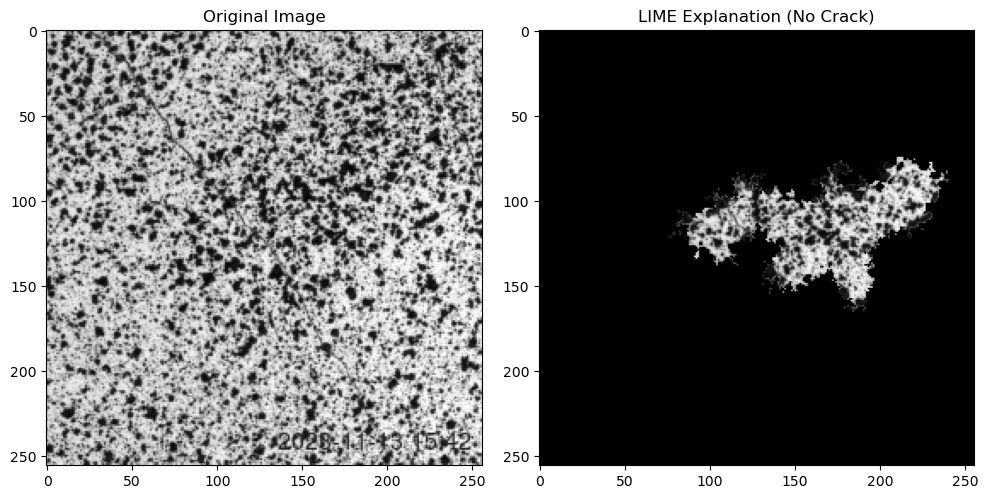


Grad-CAM Explanation:


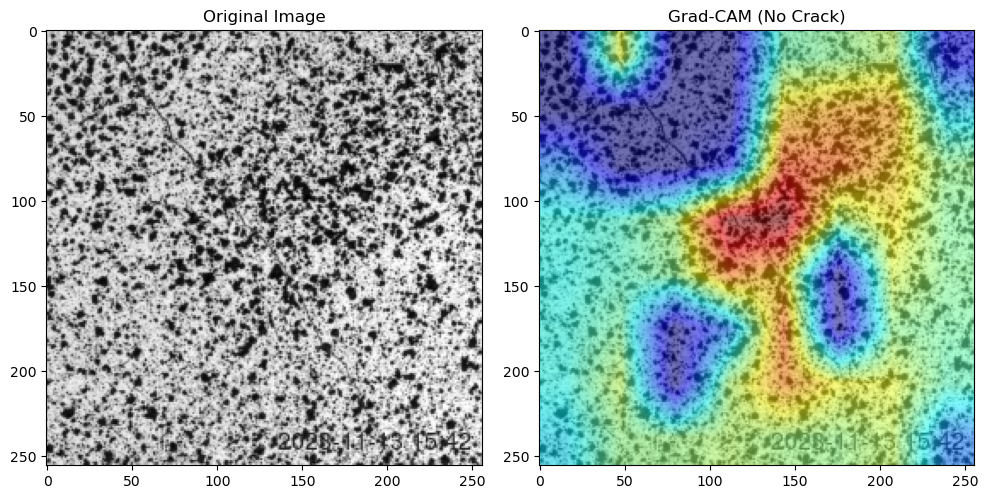

In [53]:
print("XAI Analysis for Model B:")
xai_analysis(model_B, test_loader)

XAI Analysis for Model C:

--- XAI Analysis for Model ---

Image 1 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:41<00:00, 23.99it/s]


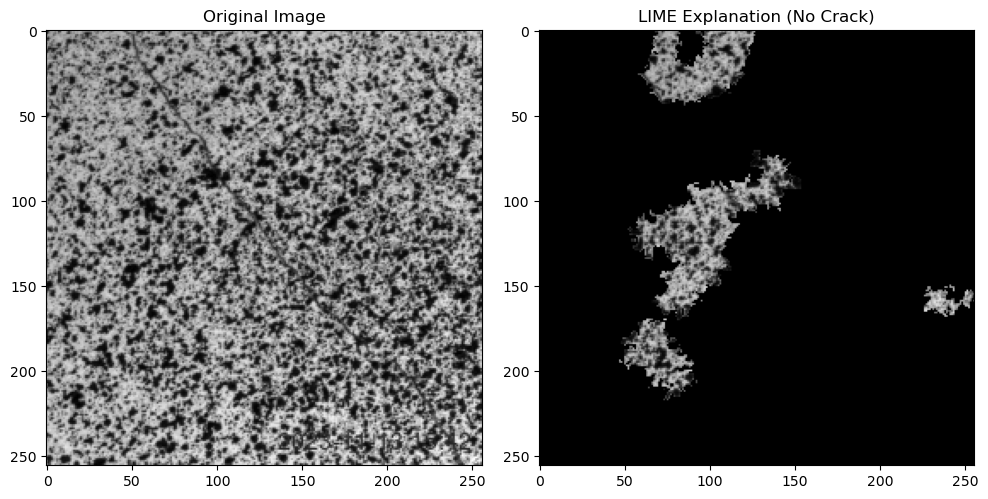


Grad-CAM Explanation:


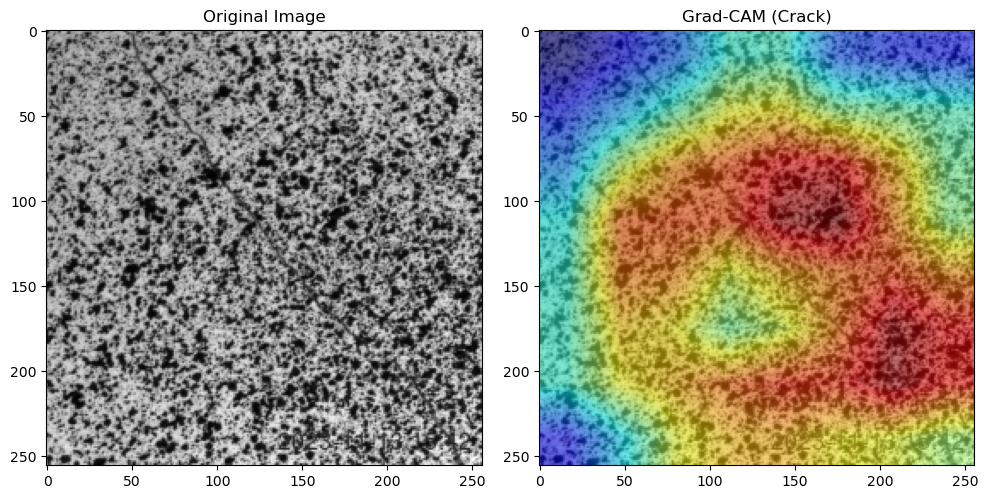


Image 2 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:41<00:00, 24.10it/s]


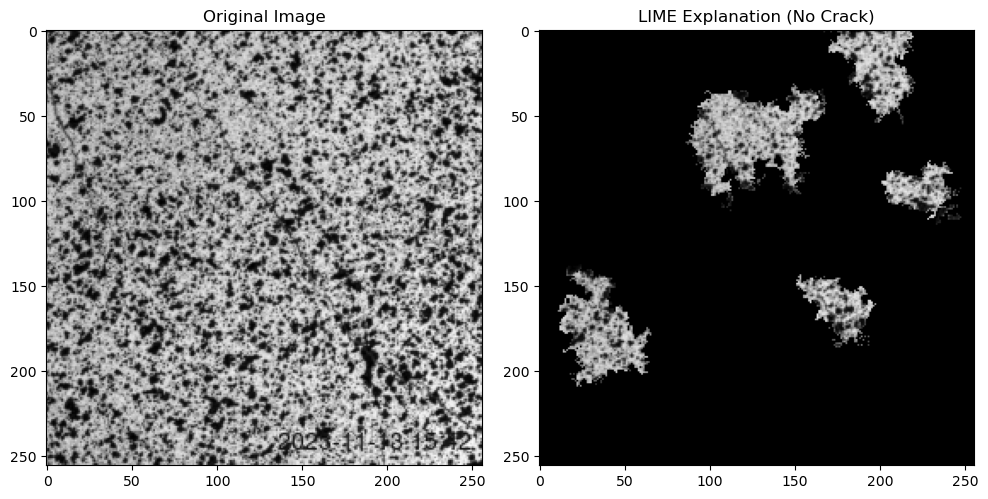


Grad-CAM Explanation:


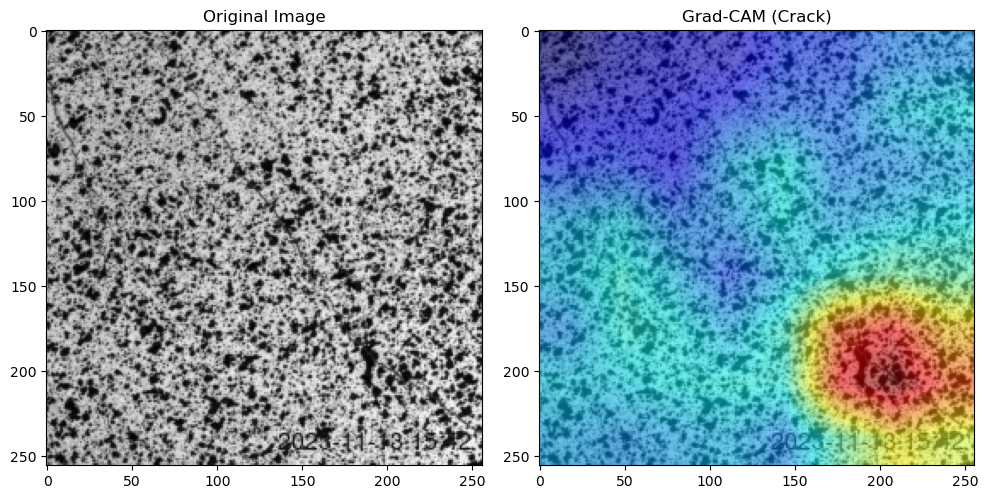


Image 3 - True Label: Crack

LIME Explanation:


100%|██████████| 1000/1000 [00:41<00:00, 24.25it/s]


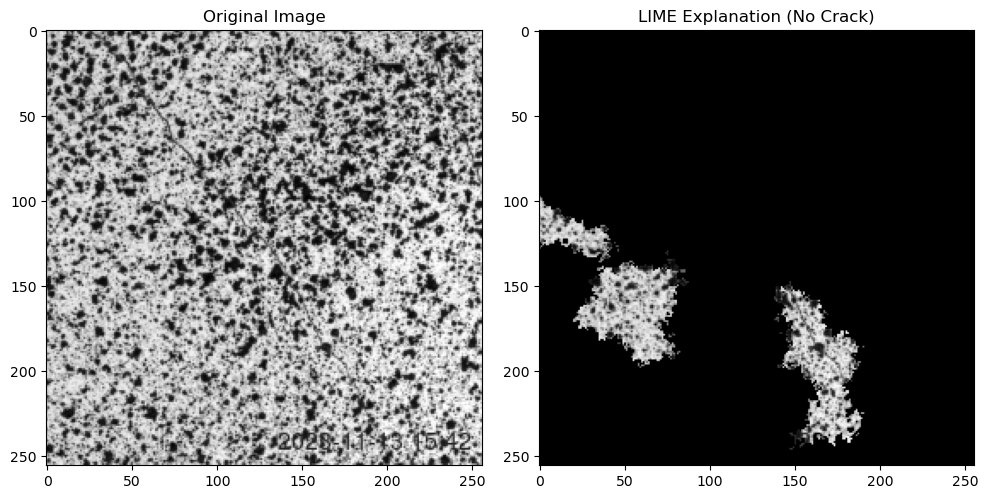


Grad-CAM Explanation:


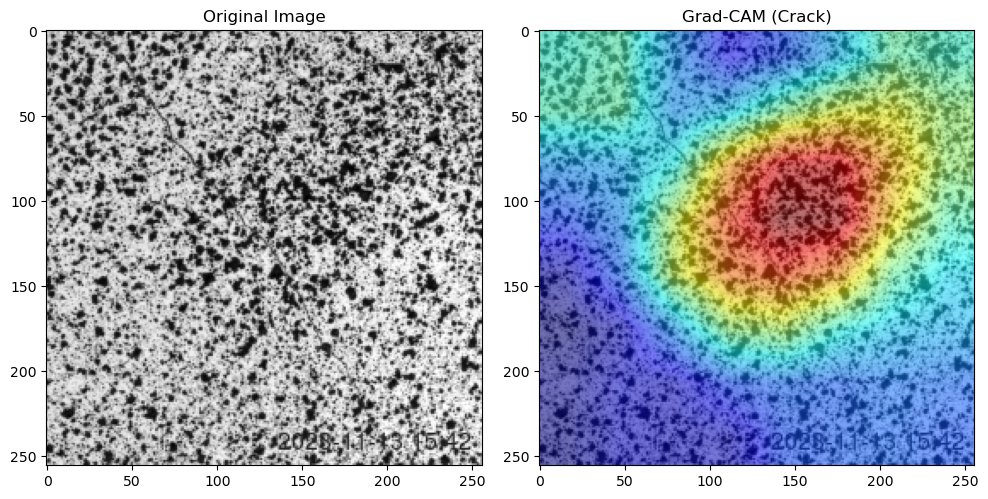

In [54]:
print("XAI Analysis for Model C:")
xai_analysis(model_C, test_loader)

### Step 3

**Which of the three models would you choose to use in production?**

We would use Model B in production because the XAI techniques show that this model is learning from the actual crack more than Models A and C. Figure 3 shows an original image with a crack, and both LIME and Grad-CAM highlight the part of the image with a crack as how the model made its predictions.



### Step 4

**For the two other models, how could you explain what happened? Propose ideas to avoid this kind of problems and build more trustworthy models in the future.**

We could not use Model A in production because it only learns to classify based on the appearance of the timestamp, as seen in Figure 2. Since only images with cracks have the timestamp, our XAI techniques showed us that the model uses the timestamp to make the predictions. In order to avoid these problems in the future, we recommend having all the images follow the same format so either all of them have a timestamp or none of them.

Model C also uses the time stamp in some instances, as seen in the Grad-Cam image of Figure 4. The LIME output in this figure highlights clusters of dark spots. This leads us to suspect that the dark spots are like a fingerprint and somehow images with a particular dark clustering have a crack. With the human eye, this is hard to detect, but it's possible that the model has learned from this. Therefore, we would not trust Model C.

Since we don’t know how the provided weights were generated, it’s also possible that the models are overfit. We don’t have access to training, and we didn’t add regularization either. 
